In [4]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.nn as nn
import torch
import gc
import os
import imageio
import yaml
from torch.optim import Adam
from datetime import datetime
from PIL import Image
import requests


In [ ]:
!nvidia-smi

Tue May  7 11:00:41 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## 2D Gaussian Splatting ##

The core function for generating 2D Gaussian Splatting. The core mechanic of this function is as follow

> Constructs a 2D Gaussian kernel using provided batch of sigma_x, sigma_y, and rho
\begin{equation} \sigma_x, \sigma_y, \rho\ \end{equation}


> Normalises and reshapes the kernel to RGB channels, pads to match the image size, and translates based on given coords. Basically poutting the relevant kernel in the relevant coordinate position.


> Multiplies the RGB kernels with given colours, sums up the layers, and returns the final clamped and permuted image.







In [2]:
def generate_2D_gaussian_splatting(kernel_size, sigma_x, sigma_y, rho, coords, colours, image_size=(256, 256, 3), device="cpu"):

    batch_size = colours.shape[0]

    sigma_x = sigma_x.view(batch_size, 1, 1)
    sigma_y = sigma_y.view(batch_size, 1, 1)
    rho = rho.view(batch_size, 1, 1)

    covariance = torch.stack(
        [torch.stack([sigma_x**2, rho*sigma_x*sigma_y], dim=-1),
        torch.stack([rho*sigma_x*sigma_y, sigma_y**2], dim=-1)],
        dim=-2
    )

    # Check for positive semi-definiteness
    determinant = (sigma_x**2) * (sigma_y**2) - (rho * sigma_x * sigma_y)**2
    if (determinant <= 0).any():
        raise ValueError("Covariance matrix must be positive semi-definite")

    inv_covariance = torch.inverse(covariance)

    # Choosing quite a broad range for the distribution [-5,5] to avoid any clipping
    start = torch.tensor([-5.0], device=device).view(-1, 1)
    end = torch.tensor([5.0], device=device).view(-1, 1)
    base_linspace = torch.linspace(0, 1, steps=kernel_size, device=device)
    ax_batch = start + (end - start) * base_linspace

    # Expanding dims for broadcasting
    ax_batch_expanded_x = ax_batch.unsqueeze(-1).expand(-1, -1, kernel_size)
    ax_batch_expanded_y = ax_batch.unsqueeze(1).expand(-1, kernel_size, -1)

    # Creating a batch-wise meshgrid using broadcasting
    xx, yy = ax_batch_expanded_x, ax_batch_expanded_y

    xy = torch.stack([xx, yy], dim=-1)
    z = torch.einsum('b...i,b...ij,b...j->b...', xy, -0.5 * inv_covariance, xy)
    kernel = torch.exp(z) / (2 * torch.tensor(np.pi, device=device) * torch.sqrt(torch.det(covariance)).view(batch_size, 1, 1))


    kernel_max_1, _ = kernel.max(dim=-1, keepdim=True)  # Find max along the last dimension
    kernel_max_2, _ = kernel_max_1.max(dim=-2, keepdim=True)  # Find max along the second-to-last dimension
    kernel_normalized = kernel / kernel_max_2

    kernel_reshaped = kernel_normalized.repeat(1, 3, 1).view(batch_size * 3, kernel_size, kernel_size)
    kernel_rgb = kernel_reshaped.unsqueeze(0).reshape(batch_size, 3, kernel_size, kernel_size)

    # Calculating the padding needed to match the image size
    pad_h = image_size[0] - kernel_size
    pad_w = image_size[1] - kernel_size

    if pad_h < 0 or pad_w < 0:
        raise ValueError("Kernel size should be smaller or equal to the image size.")

    # Adding padding to make kernel size equal to the image size
    padding = (pad_w // 2, pad_w // 2 + pad_w % 2,  # padding left and right
               pad_h // 2, pad_h // 2 + pad_h % 2)  # padding top and bottom

    kernel_rgb_padded = torch.nn.functional.pad(kernel_rgb, padding, "constant", 0)

    # Extracting shape information
    b, c, h, w = kernel_rgb_padded.shape

    # Create a batch of 2D affine matrices
    theta = torch.zeros(b, 2, 3, dtype=torch.float32, device=device)
    theta[:, 0, 0] = 1.0
    theta[:, 1, 1] = 1.0
    theta[:, :, 2] = coords

    # Creating grid and performing grid sampling
    grid = F.affine_grid(theta, size=(b, c, h, w), align_corners=True)
    kernel_rgb_padded_translated = F.grid_sample(kernel_rgb_padded, grid, align_corners=True)

    rgb_values_reshaped = colours.unsqueeze(-1).unsqueeze(-1)

    final_image_layers = rgb_values_reshaped * kernel_rgb_padded_translated
    final_image = final_image_layers.sum(dim=0)
    final_image = torch.clamp(final_image, 0, 1)
    final_image = final_image.permute(1,2,0)

    return final_image


# Example usage

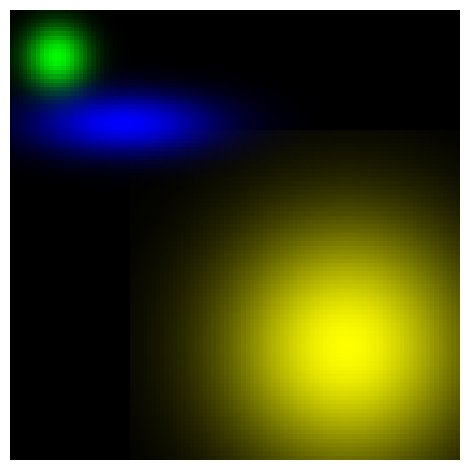

In [17]:
device = "cpu"
kernel_size = 101  # You can adjust the kernel size as needed
rho = torch.tensor([0.0, -0.0, -0.0], device=device)
sigma_x = torch.tensor([2.0, 0.5, 0.5], device=device)
sigma_y = torch.tensor([2.0, 0.5, 1.5], device=device)
vectors = torch.tensor([(-0.5, -0.5), (0.8, 0.8), (0.5, 0.5)], device=device)
colours = torch.tensor([(1.0, 1.0, 0.0), (0.0, 1.0, 0.0), (0.0, 0.0, 1.0)], device=device)
img_size = (105, 105, 3)

final_image = generate_2D_gaussian_splatting(kernel_size, sigma_x, sigma_y, rho, vectors, colours, img_size, device=device)

plt.imshow(final_image.detach().cpu().numpy())
plt.axis("off")
plt.tight_layout()
plt.show()

# Structural Similarity Index (SSIM) ##
This function calculates the combined loss by taking the weighted sum of L1 (mean absolute error) loss and the SSIM-based loss, controlled by lambda_param. This approach might be used to balance the importance of pixel-level accuracy (L1) and perceptual quality (SSIM) in the training of neural networks.

In [ ]:
def create_window(window_size, channel):
    def gaussian(window_size, sigma):
        gauss = torch.exp(torch.tensor([-(x - window_size//2)**2/float(2*sigma**2) for x in range(window_size)]))
        return gauss/gauss.sum()

    _1D_window = gaussian(window_size, 1.5).unsqueeze(1)
    _2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
    window = torch.autograd.Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())

    return window



def ssim(img1, img2, window_size=11, size_average=True):


    # Assuming the image is of shape [N, C, H, W]
    (_, _, channel) = img1.size()

    img1 = img1.unsqueeze(0).permute(0, 3, 1, 2)
    img2 = img2.unsqueeze(0).permute(0, 3, 1, 2)


    # Parameters for SSIM
    C1 = 0.01**2
    C2 = 0.03**2

    window = create_window(window_size, channel)

    if img1.is_cuda:
        window = window.cuda(img1.get_device())
    window = window.type_as(img1)

    mu1 = F.conv2d(img1, window, padding=window_size//2, groups=channel)
    mu2 = F.conv2d(img2, window, padding=window_size//2, groups=channel)
    mu1_sq = mu1.pow(2)
    mu2_sq = mu2.pow(2)
    mu1_mu2 = mu1 * mu2

    sigma1_sq = F.conv2d(img1*img1, window, padding=window_size//2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window, padding=window_size//2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1*img2, window, padding=window_size//2, groups=channel) - mu1_mu2

    SSIM_numerator = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))
    SSIM_denominator = ((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
    SSIM = SSIM_numerator / SSIM_denominator

    return torch.clamp((1 - SSIM) / 2, 0, 1)

def d_ssim_loss(img1, img2, window_size=11, size_average=True):
    return ssim(img1, img2, window_size, size_average).mean()

# Combined Loss
def combined_loss(pred, target, lambda_param=0.5):
    l1loss = nn.L1Loss()
    return (1 - lambda_param) * l1loss(pred, target) + lambda_param * d_ssim_loss(pred, target)

# Download Data ##
This is mainly to make sure the config and image file exist and downloaded from the repository especially if you running it on colab

In [ ]:
url1 = 'https://raw.githubusercontent.com/OutofAi/2D-Gaussian-Splatting/main/Image-01.png'
filename1 = url1.split('/')[-1]
response1 = requests.get(url1)
with open(filename1, 'wb') as f:
    f.write(response1.content)

url2 = 'https://raw.githubusercontent.com/OutofAi/2D-Gaussian-Splatting/main/config.yml'
filename2 = url2.split('/')[-1]
response2 = requests.get(url2)
with open(filename2, 'wb') as f:
    f.write(response2.content)


# Load Config ##

In [ ]:
# Read the config.yml file
with open('config.yml', 'r') as config_file:
    config = yaml.safe_load(config_file)

# Extract values from the loaded config
KERNEL_SIZE = config["KERNEL_SIZE"]
image_size = tuple(config["image_size"])
primary_samples = config["primary_samples"]
backup_samples = config["backup_samples"]
num_epochs = config["num_epochs"]
densification_interval = config["densification_interval"]
learning_rate = config["learning_rate"]
image_file_name = config["image_file_name"]
display_interval = config["display_interval"]
grad_threshold = config["gradient_threshold"]
gauss_threshold = config["gaussian_threshold"]
display_loss = config["display_loss"]


# clear the ram

In [ ]:
import gc

gc.collect()

torch.cuda.empty_cache()

# Prepate the points ##

In [ ]:
def give_required_data(input_coords, image_size):

  # normalising pixel coordinates [-1,1]
  coords = torch.tensor(input_coords / [image_size[0],image_size[1]], device=device).float()
  center_coords_normalized = torch.tensor([0.5, 0.5], device=device).float()
  coords = (center_coords_normalized - coords) * 2.0

  # Fetching the colour of the pixels in each coordinates
  colour_values = [image_array[coord[1], coord[0]] for coord in input_coords]
  colour_values_np = np.array(colour_values)
  colour_values_tensor =  torch.tensor(colour_values_np, device=device).float()

  return colour_values_tensor, coords

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
num_samples = primary_samples + backup_samples

PADDING = KERNEL_SIZE // 2
image_path = image_file_name
original_image = Image.open(image_path)
original_image = original_image.resize((image_size[0],image_size[0]))
original_image = original_image.convert('RGB')
original_array = np.array(original_image)
original_array = original_array / 255.0
width, height, _ = original_array.shape

image_array = original_array
target_tensor = torch.tensor(image_array, dtype=torch.float32, device=device)
coords = np.random.randint(0, [width, height], size=(num_samples, 2))
random_pixel_means = torch.tensor(coords, device=device)
pixels = [image_array[coord[0], coord[1]] for coord in coords]
pixels_np = np.array(pixels)
random_pixels =  torch.tensor(pixels_np, device=device)

colour_values, pixel_coords = give_required_data(coords, image_size)

pixel_coords = torch.atanh(pixel_coords)

sigma_values = torch.rand(num_samples, 2, device=device)
rho_values = 2 * torch.rand(num_samples, 1, device=device) - 1
alpha_values = torch.ones(num_samples, 1, device=device)
W_values = torch.cat([sigma_values, rho_values, alpha_values, colour_values, pixel_coords], dim=1)


In [ ]:
starting_size = primary_samples
left_over_size = backup_samples
persistent_mask = torch.cat([torch.ones(starting_size, dtype=bool),torch.zeros(left_over_size, dtype=bool)], dim=0)
current_marker = starting_size

In [ ]:
# Get current date and time as string
now = datetime.now().strftime("%Y_%m_%d-%H_%M_%S")

# Create a directory with the current date and time as its name
directory = f"{now}"
os.makedirs(directory, exist_ok=True)
loss_history = []

# 使用Adam优化器

In [ ]:
W = nn.Parameter(W_values)

In [ ]:
optimizer_adam = Adam([W], lr=learning_rate)

# 改用pypose的LM二阶优化

In [ ]:
!pip install pypose

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.6/127.6 kB 1.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

## pypose test

In [ ]:
import pypose as pp
class PoseInv(nn.Module):
  def __init__(self, *dim):
      super().__init__()
      self.pose = pp.Parameter(pp.randn_se3(*dim))

  def forward(self, input):
      # the last dimension of the output is 6,
      # which will be the residual dimension.
      return (self.pose.Exp() @ input).Log()

posinv = PoseInv(2, 2)
input = pp.randn_SE3(2, 2)
strategy = pp.optim.strategy.Adaptive(damping=1e-6)
optimizer = pp.optim.LM(posinv, strategy=strategy)

for idx in range(10):
  loss = optimizer.step(input)
  print('Pose Inversion loss %.7f @ %d it'%(loss, idx))
  if loss < 1e-5:
      print('Early Stopping with loss:', loss.item())
      break

/usr/local/lib/python3.10/dist-packages/pypose/lietensor/lietensor.py:918: UserWarning: Tensor Shape Invalid by calling <method 'reshape' of 'torch._C.TensorBase' objects>, go to https://pypose.org/docs/main/generated/pypose.LieTensor
  warnings.warn('Tensor Shape Invalid by calling {}, ' \
/usr/local/lib/python3.10/dist-packages/pypose/lietensor/lietensor.py:918: UserWarning: Tensor Shape Invalid by calling <built-in method cat of type object at 0x7d6b23a85840>, go to https://pypose.org/docs/main/generated/pypose.LieTensor
  warnings.warn('Tensor Shape Invalid by calling {}, ' \
/usr/local/lib/python3.10/dist-packages/pypose/lietensor/lietensor.py:918: UserWarning: Tensor Shape Invalid by calling <method 'view' of 'torch._C.TensorBase' objects>, go to https://pypose.org/docs/main/generated/pypose.LieTensor
  warnings.warn('Tensor Shape Invalid by calling {}, ' \


Pose Inversion loss 0.8757430 @ 0 it
Pose Inversion loss 0.0000902 @ 1 it
Pose Inversion loss 0.0000000 @ 2 it
Early Stopping with loss: 1.3701938889054688e-12


In [ ]:
import pypose as pp
import locale
from pypose.optim import LM
from pypose.optim.strategy import Constant
from pypose.optim.scheduler import StopOnPlateau
locale.getpreferredencoding = lambda: "UTF-8"
class weights(nn.Module):
  def __init__(self, target, lambda_param, persistent_mask, KERNEL_SIZE,
         image_size, device, tensor):
    super().__init__()
    self.target = target
    self.lambda_param = lambda_param
    self.persistent_mask = persistent_mask
    self.KERNEL_SIZE = KERNEL_SIZE
    self.image_size = image_size
    self.device = device

    self.weights = nn.Parameter(tensor)

    #parameters which need to be updated epoch by epoch
    self.output = self.weights[self.persistent_mask]
    self.batch_size = self.output.shape[0]
    self.sigma_x = torch.sigmoid(self.output[:, 0])
    self.sigma_y = torch.sigmoid(self.output[:, 1])
    self.rho = torch.tanh(self.output[:, 2])
    self.alpha = torch.sigmoid(self.output[:, 3])
    self.colours = torch.sigmoid(self.output[:, 4:7])
    self.pixel_coords = torch.tanh(self.output[:, 7:9])
    self.colours_with_alpha  = self.colours * self.alpha.view(self.batch_size, 1)
    self.g_tensor_batch = generate_2D_gaussian_splatting(self.KERNEL_SIZE, self.sigma_x, self.sigma_y,
                             self.rho, self.pixel_coords, self.colours_with_alpha,
                             self.image_size, self.device)



  def update(self, persistent_mask:torch.tensor):
    self.output = self.weights[persistent_mask]
    self.batch_size = self.output.shape[0]
    self.sigma_x = torch.sigmoid(self.output[:, 0])
    self.sigma_y = torch.sigmoid(self.output[:, 1])
    self.rho = torch.tanh(self.output[:, 2])
    self.alpha = torch.sigmoid(self.output[:, 3])
    self.colours = torch.sigmoid(self.output[:, 4:7])
    self.pixel_coords = torch.tanh(self.output[:, 7:9])
    self.colours_with_alpha  = self.colours * self.alpha.view(self.batch_size, 1)
    self.g_tensor_batch = generate_2D_gaussian_splatting(self.KERNEL_SIZE, self.sigma_x, self.sigma_y,
                             self.rho, self.pixel_coords, self.colours_with_alpha,
                             self.image_size, self.device)

  def forward(self, input):
    return combined_loss(self.g_tensor_batch, self.target, self.lambda_param)

mixture = weights(target_tensor, 0.2, persistent_mask, KERNEL_SIZE, image_size, device, W_values)
optimizer = pp.optim.LM(mixture, strategy=Constant(damping=1e-4))
scheduler = StopOnPlateau(optimizer, steps=10, patience=3, decreasing=1e-3, verbose=True)

# Training Loop ##

### origin

Pose Inversion loss 0.4571195


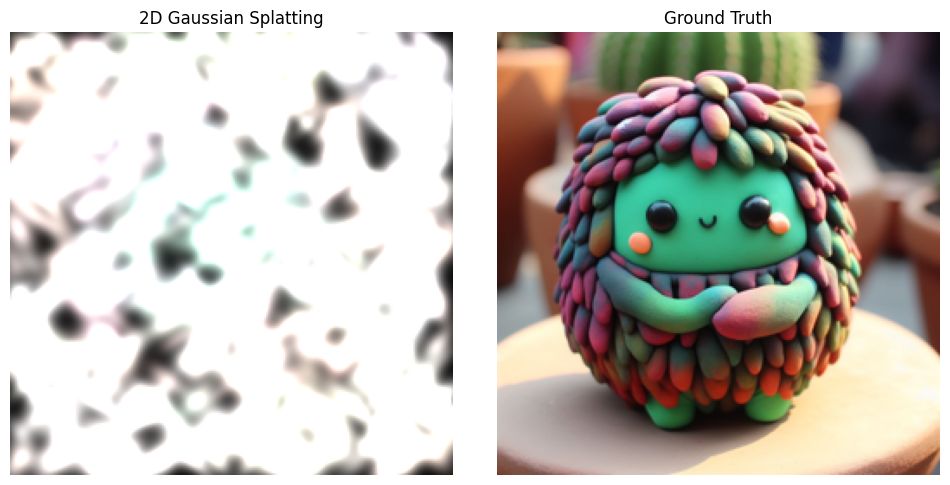

Epoch 1/2001, Loss: 0.45711952447891235, on 1000 points
Pose Inversion loss 0.4332600
Pose Inversion loss 0.4105910
Pose Inversion loss 0.3906091
Pose Inversion loss 0.3734521
Pose Inversion loss 0.3588171
Pose Inversion loss 0.3461967
Pose Inversion loss 0.3350825
Pose Inversion loss 0.3252670
Pose Inversion loss 0.3163628
Pose Inversion loss 0.3081897
Pose Inversion loss 0.3009677
Pose Inversion loss 0.2944254
Pose Inversion loss 0.2884439
Pose Inversion loss 0.2827449
Pose Inversion loss 0.2771915
Pose Inversion loss 0.2714485
Pose Inversion loss 0.2657886
Pose Inversion loss 0.2604473
Pose Inversion loss 0.2552571
Pose Inversion loss 0.2501920
Pose Inversion loss 0.2452414
Pose Inversion loss 0.2404939
Pose Inversion loss 0.2361962
Pose Inversion loss 0.2318145
Pose Inversion loss 0.2272838
Pose Inversion loss 0.2229289
Pose Inversion loss 0.2188873
Pose Inversion loss 0.2147976
Pose Inversion loss 0.2107017
Pose Inversion loss 0.2067719
Pose Inversion loss 0.2029481
Pose Inversion

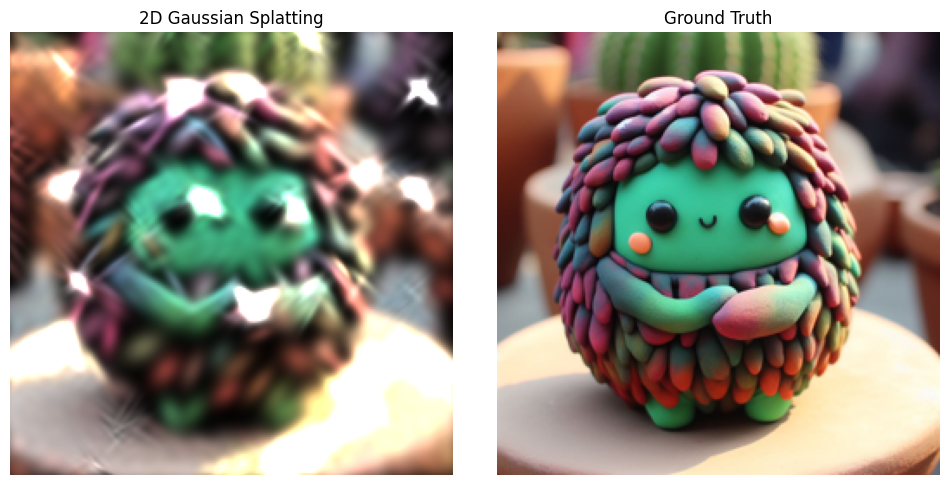

Epoch 101/2001, Loss: 0.08179152756929398, on 1000 points
Pose Inversion loss 0.0811059
Pose Inversion loss 0.0804636
Pose Inversion loss 0.0798221
Pose Inversion loss 0.0791596
Pose Inversion loss 0.0785510
Pose Inversion loss 0.0779398
Pose Inversion loss 0.0773178
Pose Inversion loss 0.0767124
Pose Inversion loss 0.0761406
Pose Inversion loss 0.0755348
Pose Inversion loss 0.0749758
Pose Inversion loss 0.0743871
Pose Inversion loss 0.0738651
Pose Inversion loss 0.0733537
Pose Inversion loss 0.0727886
Pose Inversion loss 0.0721890
Pose Inversion loss 0.0718224
Pose Inversion loss 0.0713447
Pose Inversion loss 0.0707736
Pose Inversion loss 0.0702975
Pose Inversion loss 0.0698501
Pose Inversion loss 0.0694000
Pose Inversion loss 0.0689301
Pose Inversion loss 0.0684530
Pose Inversion loss 0.0679667
Pose Inversion loss 0.0676258
Pose Inversion loss 0.0671535
Pose Inversion loss 0.0667164
Pose Inversion loss 0.0663073
Pose Inversion loss 0.0658437
Pose Inversion loss 0.0653911
Pose Inversi

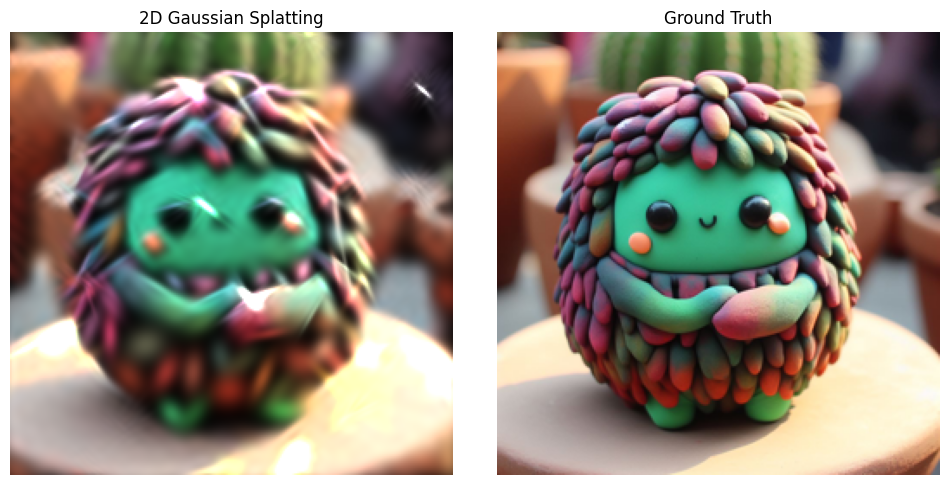

Epoch 201/2001, Loss: 0.048160307109355927, on 1000 points
Pose Inversion loss 0.0480803
Pose Inversion loss 0.0479389
Pose Inversion loss 0.0477849
Pose Inversion loss 0.0476657
Pose Inversion loss 0.0475332
Pose Inversion loss 0.0473665
Pose Inversion loss 0.0472427
Pose Inversion loss 0.0471015
Pose Inversion loss 0.0469432
Pose Inversion loss 0.0468581
Pose Inversion loss 0.0466601
Pose Inversion loss 0.0466030
Pose Inversion loss 0.0464162
Pose Inversion loss 0.0463090
Pose Inversion loss 0.0462222
Pose Inversion loss 0.0461454
Pose Inversion loss 0.0459515
Pose Inversion loss 0.0459132
Pose Inversion loss 0.0457434
Pose Inversion loss 0.0456944
Pose Inversion loss 0.0455417
Pose Inversion loss 0.0453666
Pose Inversion loss 0.0453283
Pose Inversion loss 0.0451437
Pose Inversion loss 0.0451136
Pose Inversion loss 0.0449428
Pose Inversion loss 0.0448464
Pose Inversion loss 0.0448236
Pose Inversion loss 0.0446529
Pose Inversion loss 0.0445515
Pose Inversion loss 0.0445405
Pose Invers

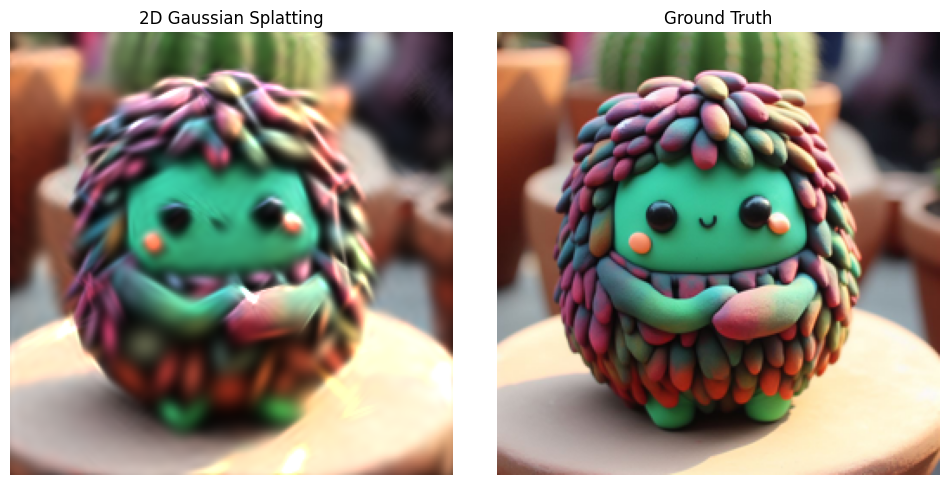

Epoch 301/2001, Loss: 0.039020705968141556, on 1000 points
Pose Inversion loss 0.0962932
Pose Inversion loss 0.0897436
Pose Inversion loss 0.0826230
Pose Inversion loss 0.0780983
Pose Inversion loss 0.0735878
Pose Inversion loss 0.0710659
Pose Inversion loss 0.0688304
Pose Inversion loss 0.0662941
Pose Inversion loss 0.0638717
Pose Inversion loss 0.0623416
Pose Inversion loss 0.0605928
Pose Inversion loss 0.0586667
Pose Inversion loss 0.0566645
Pose Inversion loss 0.0559290
Pose Inversion loss 0.0550524
Pose Inversion loss 0.0533894
Pose Inversion loss 0.0523830
Pose Inversion loss 0.0511011
Pose Inversion loss 0.0502961
Pose Inversion loss 0.0493404
Pose Inversion loss 0.0484668
Pose Inversion loss 0.0476298
Pose Inversion loss 0.0472061
Pose Inversion loss 0.0463804
Pose Inversion loss 0.0457781
Pose Inversion loss 0.0450127
Pose Inversion loss 0.0443641
Pose Inversion loss 0.0438871
Pose Inversion loss 0.0434096
Pose Inversion loss 0.0429818
Pose Inversion loss 0.0426152
Pose Invers

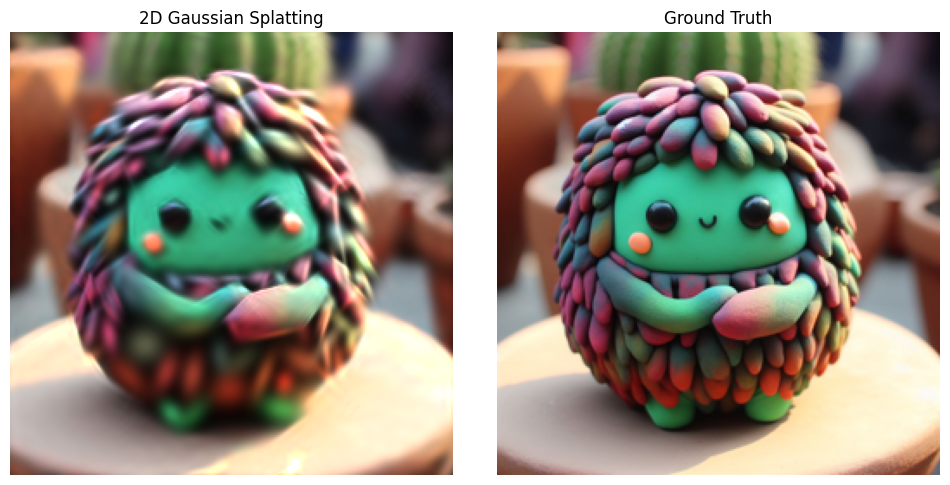

Epoch 401/2001, Loss: 0.03390216454863548, on 1176 points
Pose Inversion loss 0.0338764
Pose Inversion loss 0.0338316
Pose Inversion loss 0.0337762
Pose Inversion loss 0.0336399
Pose Inversion loss 0.0337124
Pose Inversion loss 0.0336217
Pose Inversion loss 0.0335576
Pose Inversion loss 0.0335301
Pose Inversion loss 0.0334858
Pose Inversion loss 0.0334550
Pose Inversion loss 0.0334045
Pose Inversion loss 0.0333823
Pose Inversion loss 0.0333045
Pose Inversion loss 0.0333318
Pose Inversion loss 0.0332671
Pose Inversion loss 0.0332892
Pose Inversion loss 0.0332361
Pose Inversion loss 0.0331669
Pose Inversion loss 0.0331389
Pose Inversion loss 0.0330607
Pose Inversion loss 0.0330940
Pose Inversion loss 0.0330625
Pose Inversion loss 0.0330707
Pose Inversion loss 0.0330094
Pose Inversion loss 0.0329723
Pose Inversion loss 0.0329117
Pose Inversion loss 0.0329451
Pose Inversion loss 0.0328946
Pose Inversion loss 0.0328147
Pose Inversion loss 0.0327278
Pose Inversion loss 0.0327202
Pose Inversi

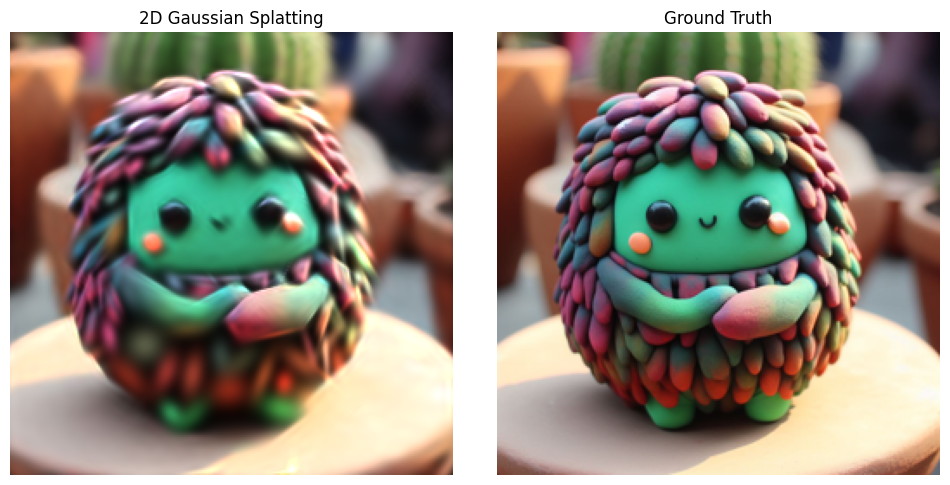

Epoch 501/2001, Loss: 0.030596159398555756, on 1176 points
Pose Inversion loss 0.0305279
Pose Inversion loss 0.0305001
Pose Inversion loss 0.0305222
Pose Inversion loss 0.0304420
Pose Inversion loss 0.0304023
Pose Inversion loss 0.0303938
Pose Inversion loss 0.0303519
Pose Inversion loss 0.0303587
Pose Inversion loss 0.0303486
Pose Inversion loss 0.0303564
Pose Inversion loss 0.0302838
Pose Inversion loss 0.0302220
Pose Inversion loss 0.0302858
Pose Inversion loss 0.0302161
Pose Inversion loss 0.0302073
Pose Inversion loss 0.0301791
Pose Inversion loss 0.0301755
Pose Inversion loss 0.0300853
Pose Inversion loss 0.0301010
Pose Inversion loss 0.0300722
Pose Inversion loss 0.0300207
Pose Inversion loss 0.0300320
Pose Inversion loss 0.0300049
Pose Inversion loss 0.0299572
Pose Inversion loss 0.0299274
Pose Inversion loss 0.0299366
Pose Inversion loss 0.0299003
Pose Inversion loss 0.0298940
Pose Inversion loss 0.0298384
Pose Inversion loss 0.0298226
Pose Inversion loss 0.0298087
Pose Invers

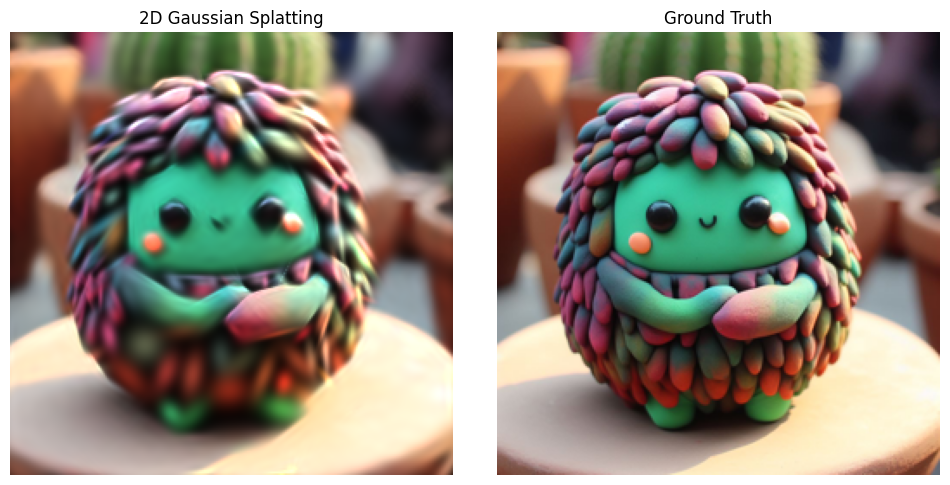

Epoch 601/2001, Loss: 0.02861945331096649, on 1176 points
Pose Inversion loss 0.0898235
Pose Inversion loss 0.0811651
Pose Inversion loss 0.0729988
Pose Inversion loss 0.0685464
Pose Inversion loss 0.0645253
Pose Inversion loss 0.0608744
Pose Inversion loss 0.0584175
Pose Inversion loss 0.0557798
Pose Inversion loss 0.0541580
Pose Inversion loss 0.0522664
Pose Inversion loss 0.0507620
Pose Inversion loss 0.0485542
Pose Inversion loss 0.0471603
Pose Inversion loss 0.0454166
Pose Inversion loss 0.0445772
Pose Inversion loss 0.0434461
Pose Inversion loss 0.0423442
Pose Inversion loss 0.0411243
Pose Inversion loss 0.0402850
Pose Inversion loss 0.0391818
Pose Inversion loss 0.0382509
Pose Inversion loss 0.0376101
Pose Inversion loss 0.0370624
Pose Inversion loss 0.0363516
Pose Inversion loss 0.0357986
Pose Inversion loss 0.0349368
Pose Inversion loss 0.0345496
Pose Inversion loss 0.0341404
Pose Inversion loss 0.0336375
Pose Inversion loss 0.0335346
Pose Inversion loss 0.0330243
Pose Inversi

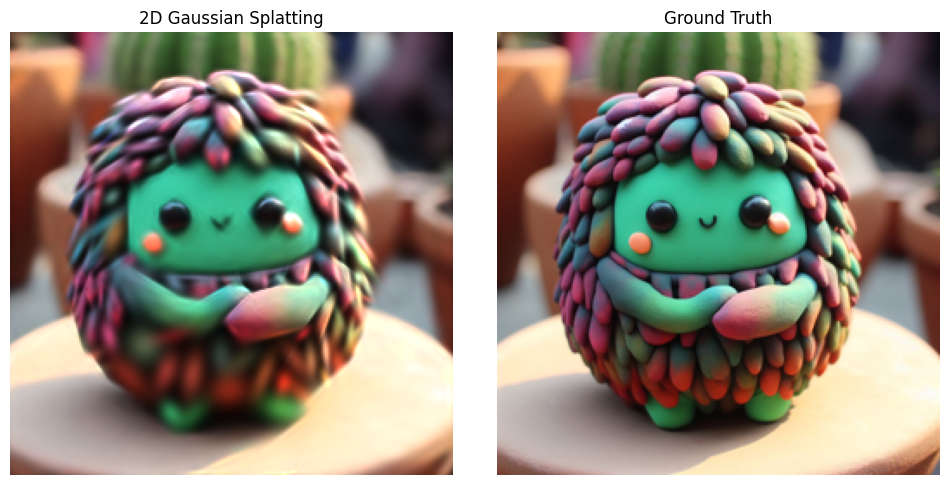

Epoch 701/2001, Loss: 0.026727084070444107, on 1381 points
Pose Inversion loss 0.0266937
Pose Inversion loss 0.0267088
Pose Inversion loss 0.0266733
Pose Inversion loss 0.0266449
Pose Inversion loss 0.0266257
Pose Inversion loss 0.0266637
Pose Inversion loss 0.0266077
Pose Inversion loss 0.0265873
Pose Inversion loss 0.0265417
Pose Inversion loss 0.0265316
Pose Inversion loss 0.0265010
Pose Inversion loss 0.0264950
Pose Inversion loss 0.0264739
Pose Inversion loss 0.0265416
Pose Inversion loss 0.0264555
Pose Inversion loss 0.0264765
Pose Inversion loss 0.0264753
Pose Inversion loss 0.0263636
Pose Inversion loss 0.0263899
Pose Inversion loss 0.0263539
Pose Inversion loss 0.0262926
Pose Inversion loss 0.0263632
Pose Inversion loss 0.0263131
Pose Inversion loss 0.0263145
Pose Inversion loss 0.0262974
Pose Inversion loss 0.0262485
Pose Inversion loss 0.0262141
Pose Inversion loss 0.0262104
Pose Inversion loss 0.0261971
Pose Inversion loss 0.0262239
Pose Inversion loss 0.0261833
Pose Invers

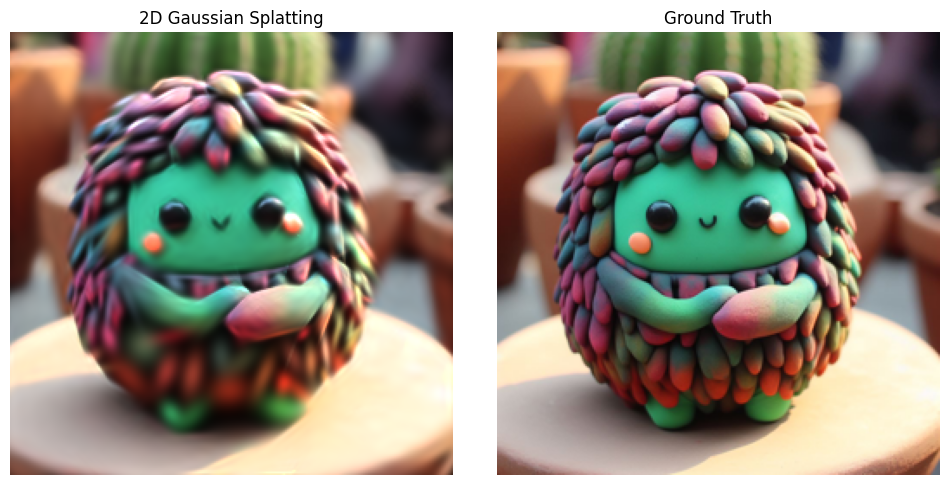

Epoch 801/2001, Loss: 0.02531443163752556, on 1381 points
Pose Inversion loss 0.0253194
Pose Inversion loss 0.0251673
Pose Inversion loss 0.0252210
Pose Inversion loss 0.0252553
Pose Inversion loss 0.0252054
Pose Inversion loss 0.0252118
Pose Inversion loss 0.0252221
Pose Inversion loss 0.0251824
Pose Inversion loss 0.0251945
Pose Inversion loss 0.0251301
Pose Inversion loss 0.0250617
Pose Inversion loss 0.0250921
Pose Inversion loss 0.0250932
Pose Inversion loss 0.0250173
Pose Inversion loss 0.0250864
Pose Inversion loss 0.0250513
Pose Inversion loss 0.0250271
Pose Inversion loss 0.0250999
Pose Inversion loss 0.0250172
Pose Inversion loss 0.0250327
Pose Inversion loss 0.0250254
Pose Inversion loss 0.0250048
Pose Inversion loss 0.0250120
Pose Inversion loss 0.0249473
Pose Inversion loss 0.0249139
Pose Inversion loss 0.0249261
Pose Inversion loss 0.0249224
Pose Inversion loss 0.0248821
Pose Inversion loss 0.0248428
Pose Inversion loss 0.0248875
Pose Inversion loss 0.0248460
Pose Inversi

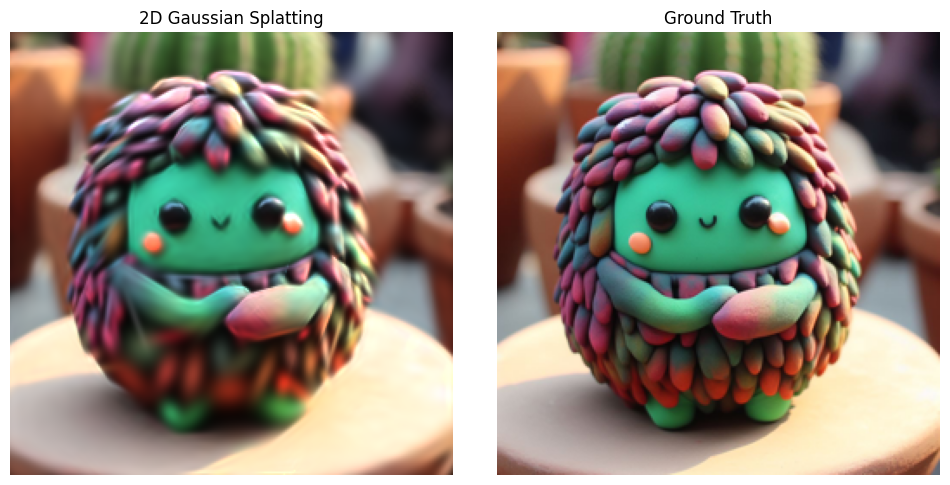

Epoch 901/2001, Loss: 0.024246802553534508, on 1381 points
Pose Inversion loss 0.0994078
Pose Inversion loss 0.0887975
Pose Inversion loss 0.0781919
Pose Inversion loss 0.0709593
Pose Inversion loss 0.0656635
Pose Inversion loss 0.0607256
Pose Inversion loss 0.0586913
Pose Inversion loss 0.0565341
Pose Inversion loss 0.0544177
Pose Inversion loss 0.0524409
Pose Inversion loss 0.0506476
Pose Inversion loss 0.0491636
Pose Inversion loss 0.0472607
Pose Inversion loss 0.0452764
Pose Inversion loss 0.0436116
Pose Inversion loss 0.0427366
Pose Inversion loss 0.0411358
Pose Inversion loss 0.0405103
Pose Inversion loss 0.0393181
Pose Inversion loss 0.0381210
Pose Inversion loss 0.0370560
Pose Inversion loss 0.0359538
Pose Inversion loss 0.0349583
Pose Inversion loss 0.0341267
Pose Inversion loss 0.0333789
Pose Inversion loss 0.0326261
Pose Inversion loss 0.0319998
Pose Inversion loss 0.0314051
Pose Inversion loss 0.0311108
Pose Inversion loss 0.0303789
Pose Inversion loss 0.0300092
Pose Invers

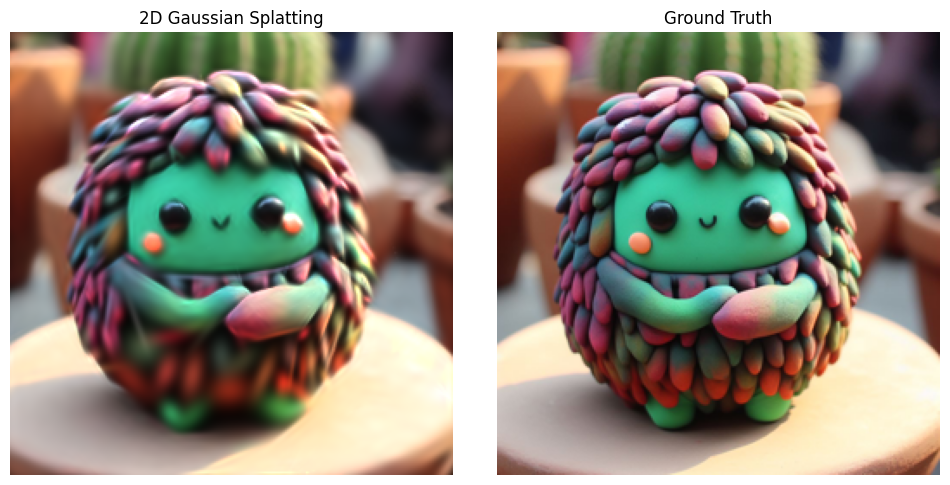

Epoch 1001/2001, Loss: 0.023083645850419998, on 1661 points
Pose Inversion loss 0.0230672
Pose Inversion loss 0.0230738
Pose Inversion loss 0.0229788
Pose Inversion loss 0.0230026
Pose Inversion loss 0.0229816
Pose Inversion loss 0.0229263
Pose Inversion loss 0.0229503
Pose Inversion loss 0.0228781
Pose Inversion loss 0.0229121
Pose Inversion loss 0.0229086
Pose Inversion loss 0.0229408
Pose Inversion loss 0.0228421
Pose Inversion loss 0.0228167
Pose Inversion loss 0.0229114
Pose Inversion loss 0.0229268
Pose Inversion loss 0.0227958
Pose Inversion loss 0.0228475
Pose Inversion loss 0.0227567
Pose Inversion loss 0.0227967
Pose Inversion loss 0.0228092
Pose Inversion loss 0.0227546
Pose Inversion loss 0.0227543
Pose Inversion loss 0.0227600
Pose Inversion loss 0.0227464
Pose Inversion loss 0.0227034
Pose Inversion loss 0.0226790
Pose Inversion loss 0.0227037
Pose Inversion loss 0.0226397
Pose Inversion loss 0.0226769
Pose Inversion loss 0.0227238
Pose Inversion loss 0.0226391
Pose Inver

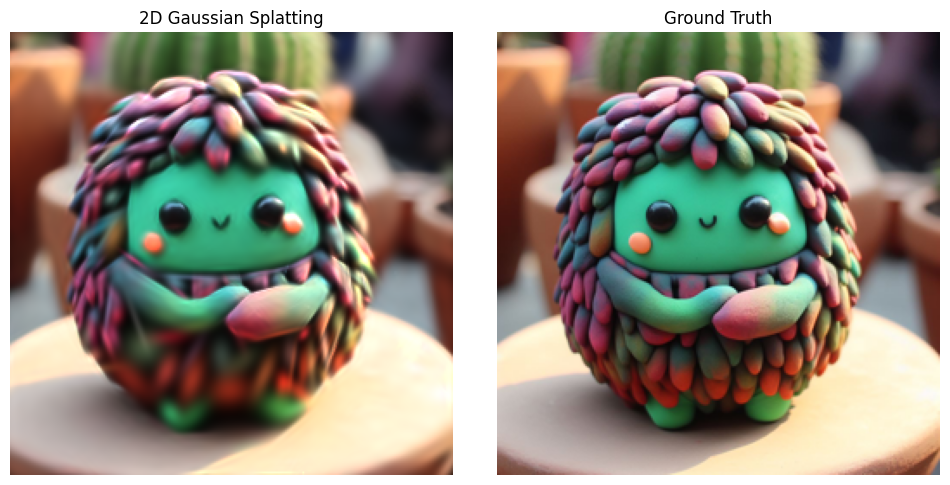

Epoch 1101/2001, Loss: 0.021960727870464325, on 1661 points
Pose Inversion loss 0.0219323
Pose Inversion loss 0.0219551
Pose Inversion loss 0.0218764
Pose Inversion loss 0.0219469
Pose Inversion loss 0.0218850
Pose Inversion loss 0.0219116
Pose Inversion loss 0.0218947
Pose Inversion loss 0.0218164
Pose Inversion loss 0.0218613
Pose Inversion loss 0.0218443
Pose Inversion loss 0.0218811
Pose Inversion loss 0.0218940
Pose Inversion loss 0.0218307
Pose Inversion loss 0.0218462
Pose Inversion loss 0.0218304
Pose Inversion loss 0.0217792
Pose Inversion loss 0.0217203
Pose Inversion loss 0.0217774
Pose Inversion loss 0.0217231
Pose Inversion loss 0.0217823
Pose Inversion loss 0.0217237
Pose Inversion loss 0.0217369
Pose Inversion loss 0.0217224
Pose Inversion loss 0.0217550
Pose Inversion loss 0.0217241
Pose Inversion loss 0.0216386
Pose Inversion loss 0.0216296
Pose Inversion loss 0.0216674
Pose Inversion loss 0.0216126
Pose Inversion loss 0.0216450
Pose Inversion loss 0.0216322
Pose Inver

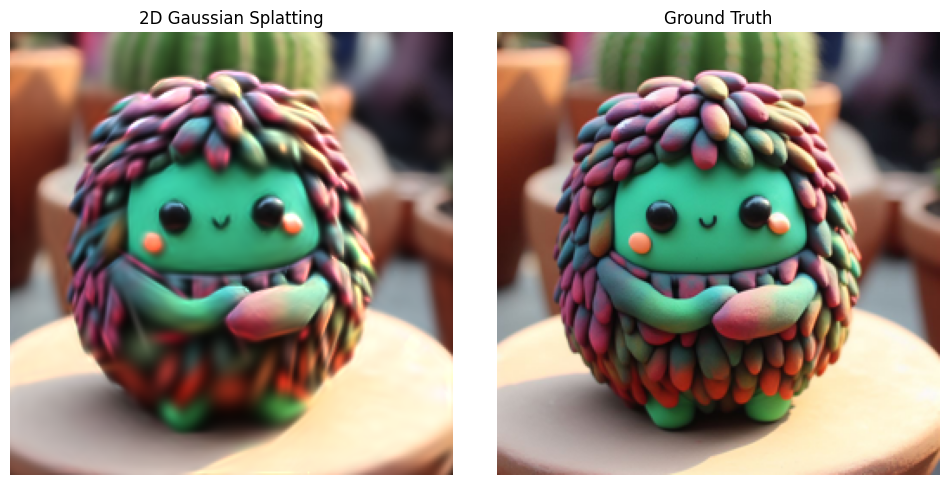

Epoch 1201/2001, Loss: 0.02107553370296955, on 1661 points
Pose Inversion loss 0.0937516
Pose Inversion loss 0.0832165
Pose Inversion loss 0.0722411
Pose Inversion loss 0.0651677
Pose Inversion loss 0.0596292
Pose Inversion loss 0.0561567
Pose Inversion loss 0.0530395
Pose Inversion loss 0.0509201
Pose Inversion loss 0.0495210
Pose Inversion loss 0.0475584
Pose Inversion loss 0.0460823
Pose Inversion loss 0.0444398
Pose Inversion loss 0.0423776
Pose Inversion loss 0.0407088
Pose Inversion loss 0.0398932
Pose Inversion loss 0.0382322
Pose Inversion loss 0.0372251
Pose Inversion loss 0.0361742
Pose Inversion loss 0.0350281
Pose Inversion loss 0.0343644
Pose Inversion loss 0.0334827
Pose Inversion loss 0.0324012
Pose Inversion loss 0.0315295
Pose Inversion loss 0.0306770
Pose Inversion loss 0.0298391
Pose Inversion loss 0.0292243
Pose Inversion loss 0.0287204
Pose Inversion loss 0.0282907
Pose Inversion loss 0.0276945
Pose Inversion loss 0.0273461
Pose Inversion loss 0.0267706
Pose Invers

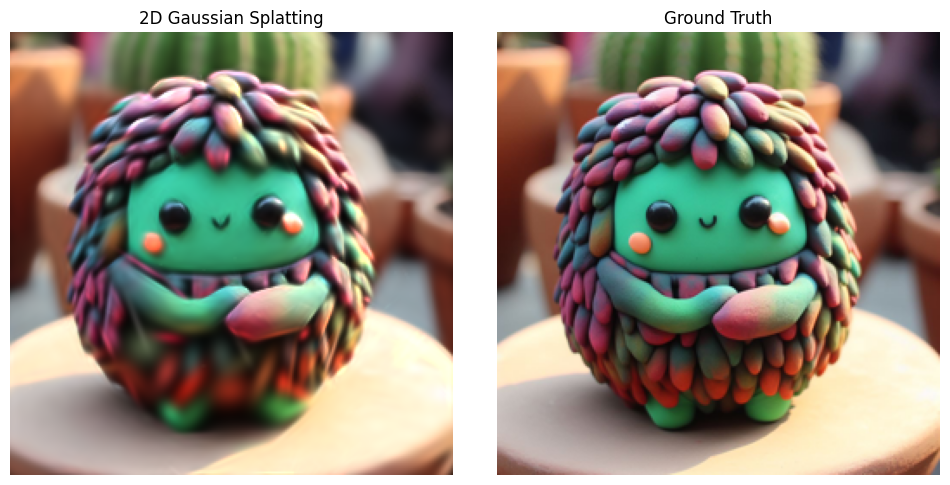

Epoch 1301/2001, Loss: 0.020284220576286316, on 1960 points
Pose Inversion loss 0.0202932
Pose Inversion loss 0.0203256
Pose Inversion loss 0.0202926
Pose Inversion loss 0.0202831
Pose Inversion loss 0.0202574
Pose Inversion loss 0.0202706
Pose Inversion loss 0.0202596
Pose Inversion loss 0.0202601
Pose Inversion loss 0.0203491
Pose Inversion loss 0.0202629
Pose Inversion loss 0.0202139
Pose Inversion loss 0.0201884
Pose Inversion loss 0.0202013
Pose Inversion loss 0.0201520
Pose Inversion loss 0.0202071
Pose Inversion loss 0.0201808
Pose Inversion loss 0.0201353
Pose Inversion loss 0.0200987
Pose Inversion loss 0.0201957
Pose Inversion loss 0.0201281
Pose Inversion loss 0.0201871
Pose Inversion loss 0.0201764
Pose Inversion loss 0.0200759
Pose Inversion loss 0.0201070
Pose Inversion loss 0.0200456
Pose Inversion loss 0.0200263
Pose Inversion loss 0.0199904
Pose Inversion loss 0.0200342
Pose Inversion loss 0.0199431
Pose Inversion loss 0.0199871
Pose Inversion loss 0.0200246
Pose Inver

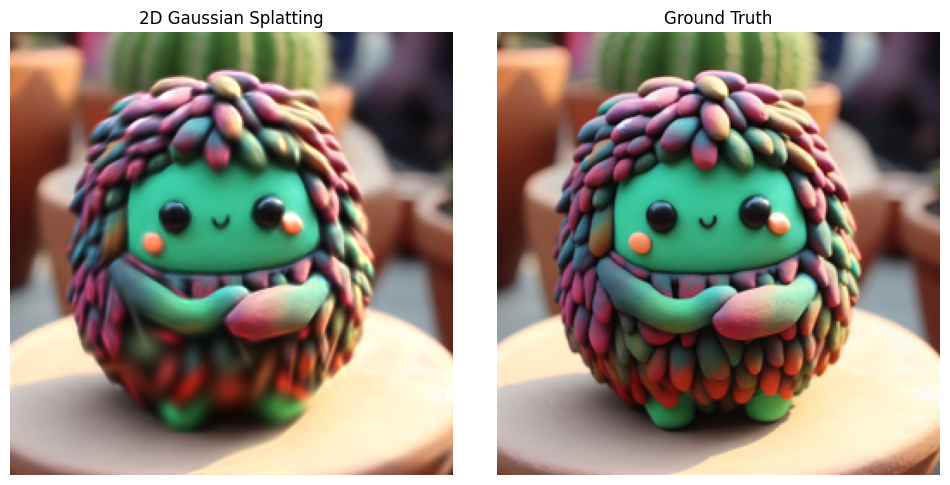

Epoch 1401/2001, Loss: 0.019272275269031525, on 1960 points
Pose Inversion loss 0.0192119
Pose Inversion loss 0.0191490
Pose Inversion loss 0.0192680
Pose Inversion loss 0.0191737
Pose Inversion loss 0.0192251
Pose Inversion loss 0.0192385
Pose Inversion loss 0.0192457
Pose Inversion loss 0.0191831
Pose Inversion loss 0.0191655
Pose Inversion loss 0.0192303
Pose Inversion loss 0.0190786
Pose Inversion loss 0.0191955
Pose Inversion loss 0.0192114
Pose Inversion loss 0.0192151
Pose Inversion loss 0.0191787
Pose Inversion loss 0.0190828
Pose Inversion loss 0.0191500
Pose Inversion loss 0.0190921
Pose Inversion loss 0.0191187
Pose Inversion loss 0.0191562
Pose Inversion loss 0.0190809
Pose Inversion loss 0.0190580
Pose Inversion loss 0.0190932
Pose Inversion loss 0.0191233
Pose Inversion loss 0.0190813
Pose Inversion loss 0.0190860
Pose Inversion loss 0.0190694
Pose Inversion loss 0.0189837
Pose Inversion loss 0.0190596
Pose Inversion loss 0.0190401
Pose Inversion loss 0.0190317
Pose Inver

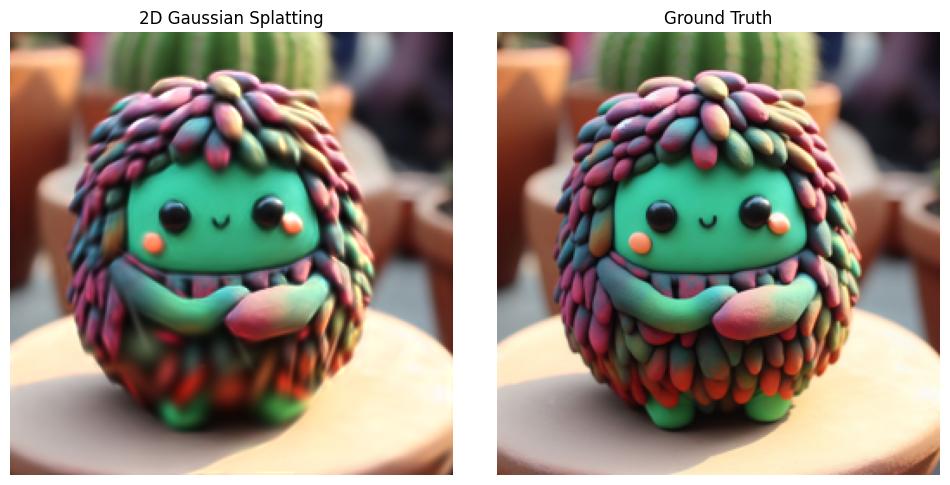

Epoch 1501/2001, Loss: 0.01858634315431118, on 1960 points
Pose Inversion loss 0.0949759
Pose Inversion loss 0.0832287
Pose Inversion loss 0.0715476
Pose Inversion loss 0.0639605
Pose Inversion loss 0.0588132
Pose Inversion loss 0.0553905
Pose Inversion loss 0.0523642
Pose Inversion loss 0.0494327
Pose Inversion loss 0.0479194
Pose Inversion loss 0.0472482
Pose Inversion loss 0.0447171
Pose Inversion loss 0.0428606
Pose Inversion loss 0.0409559
Pose Inversion loss 0.0395391
Pose Inversion loss 0.0373438
Pose Inversion loss 0.0363393
Pose Inversion loss 0.0352330
Pose Inversion loss 0.0341845
Pose Inversion loss 0.0330515
Pose Inversion loss 0.0319296
Pose Inversion loss 0.0311873
Pose Inversion loss 0.0304077
Pose Inversion loss 0.0293252
Pose Inversion loss 0.0284233
Pose Inversion loss 0.0278449
Pose Inversion loss 0.0273145
Pose Inversion loss 0.0266176
Pose Inversion loss 0.0261157
Pose Inversion loss 0.0254494
Pose Inversion loss 0.0249770
Pose Inversion loss 0.0245825
Pose Invers

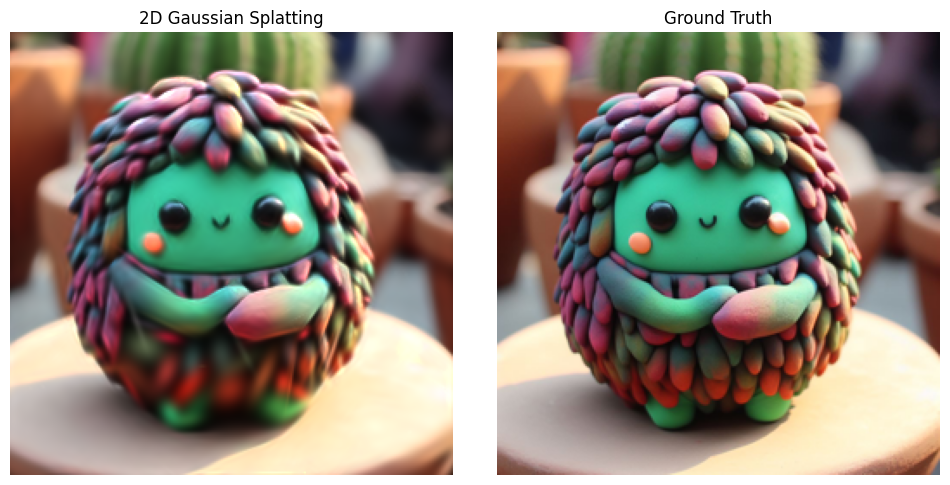

Epoch 1601/2001, Loss: 0.01819244585931301, on 2286 points
Pose Inversion loss 0.0181550
Pose Inversion loss 0.0181734
Pose Inversion loss 0.0181156
Pose Inversion loss 0.0181880
Pose Inversion loss 0.0181346
Pose Inversion loss 0.0182035
Pose Inversion loss 0.0181238
Pose Inversion loss 0.0180692
Pose Inversion loss 0.0181113
Pose Inversion loss 0.0181478
Pose Inversion loss 0.0181253
Pose Inversion loss 0.0181394
Pose Inversion loss 0.0181186
Pose Inversion loss 0.0180731
Pose Inversion loss 0.0180375
Pose Inversion loss 0.0180398
Pose Inversion loss 0.0180891
Pose Inversion loss 0.0180576
Pose Inversion loss 0.0180227
Pose Inversion loss 0.0181083
Pose Inversion loss 0.0180347
Pose Inversion loss 0.0179720
Pose Inversion loss 0.0180129
Pose Inversion loss 0.0180078
Pose Inversion loss 0.0180156
Pose Inversion loss 0.0180184
Pose Inversion loss 0.0179893
Pose Inversion loss 0.0180100
Pose Inversion loss 0.0179658
Pose Inversion loss 0.0180340
Pose Inversion loss 0.0179341
Pose Invers

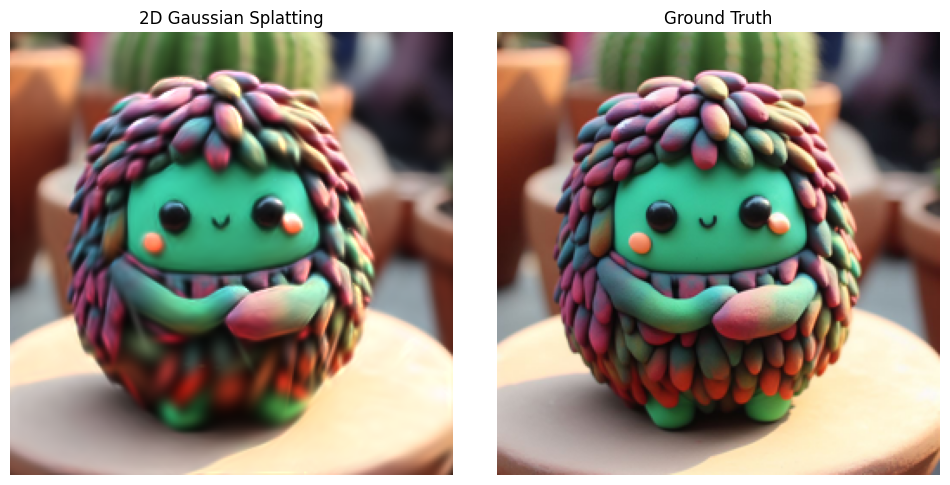

Epoch 1701/2001, Loss: 0.017496231943368912, on 2286 points
Pose Inversion loss 0.0175445
Pose Inversion loss 0.0175355
Pose Inversion loss 0.0174740
Pose Inversion loss 0.0174488
Pose Inversion loss 0.0174937
Pose Inversion loss 0.0174589
Pose Inversion loss 0.0173827
Pose Inversion loss 0.0174665
Pose Inversion loss 0.0174007
Pose Inversion loss 0.0174435
Pose Inversion loss 0.0173711
Pose Inversion loss 0.0174590
Pose Inversion loss 0.0173856
Pose Inversion loss 0.0174230
Pose Inversion loss 0.0174672
Pose Inversion loss 0.0174722
Pose Inversion loss 0.0174117
Pose Inversion loss 0.0173565
Pose Inversion loss 0.0174289
Pose Inversion loss 0.0173946
Pose Inversion loss 0.0173590
Pose Inversion loss 0.0173161
Pose Inversion loss 0.0173740
Pose Inversion loss 0.0173851
Pose Inversion loss 0.0173940
Pose Inversion loss 0.0173574
Pose Inversion loss 0.0173224
Pose Inversion loss 0.0172991
Pose Inversion loss 0.0173158
Pose Inversion loss 0.0173191
Pose Inversion loss 0.0172904
Pose Inver

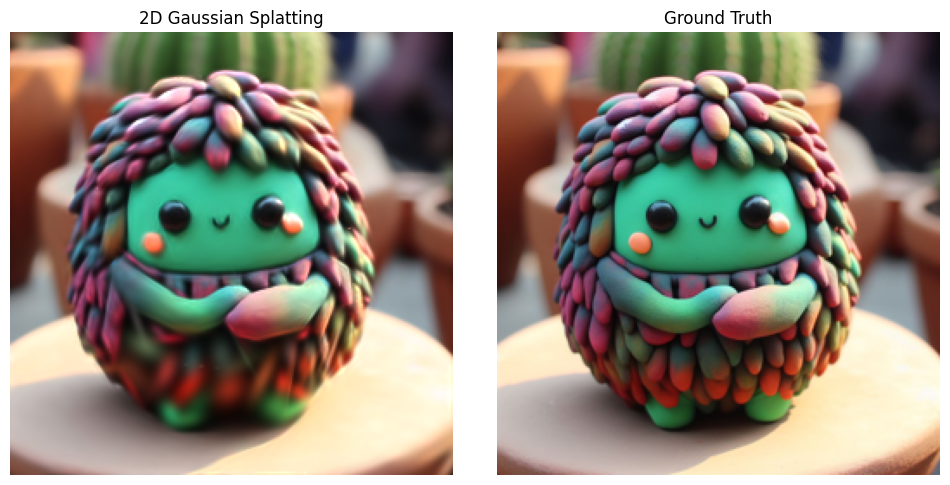

Epoch 1801/2001, Loss: 0.017023440450429916, on 2286 points
Pose Inversion loss 0.0860063
Pose Inversion loss 0.0768920
Pose Inversion loss 0.0657268
Pose Inversion loss 0.0575376
Pose Inversion loss 0.0525888
Pose Inversion loss 0.0495284
Pose Inversion loss 0.0469470
Pose Inversion loss 0.0450906
Pose Inversion loss 0.0432115
Pose Inversion loss 0.0414936
Pose Inversion loss 0.0402215
Pose Inversion loss 0.0387752
Pose Inversion loss 0.0365923
Pose Inversion loss 0.0356967
Pose Inversion loss 0.0342815
Pose Inversion loss 0.0328278
Pose Inversion loss 0.0321714
Pose Inversion loss 0.0309808
Pose Inversion loss 0.0297525
Pose Inversion loss 0.0289350
Pose Inversion loss 0.0279046
Pose Inversion loss 0.0270742
Pose Inversion loss 0.0267263
Pose Inversion loss 0.0258553
Pose Inversion loss 0.0254630
Pose Inversion loss 0.0246906
Pose Inversion loss 0.0241075
Pose Inversion loss 0.0234633
Pose Inversion loss 0.0231065
Pose Inversion loss 0.0226144
Pose Inversion loss 0.0221995
Pose Inver

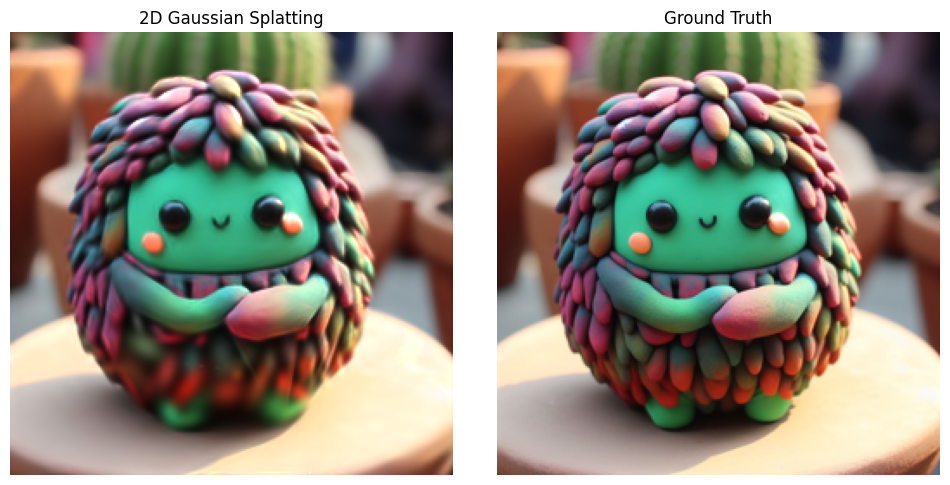

Epoch 1901/2001, Loss: 0.016454096883535385, on 2591 points
Pose Inversion loss 0.0165024
Pose Inversion loss 0.0164622
Pose Inversion loss 0.0164556
Pose Inversion loss 0.0163391
Pose Inversion loss 0.0164518
Pose Inversion loss 0.0163584
Pose Inversion loss 0.0163961
Pose Inversion loss 0.0164056
Pose Inversion loss 0.0163275
Pose Inversion loss 0.0164195
Pose Inversion loss 0.0163628
Pose Inversion loss 0.0163258
Pose Inversion loss 0.0163757
Pose Inversion loss 0.0163521
Pose Inversion loss 0.0163177
Pose Inversion loss 0.0163054
Pose Inversion loss 0.0163295
Pose Inversion loss 0.0162081
Pose Inversion loss 0.0162484
Pose Inversion loss 0.0163134
Pose Inversion loss 0.0162915
Pose Inversion loss 0.0161945
Pose Inversion loss 0.0162609
Pose Inversion loss 0.0161750
Pose Inversion loss 0.0162114
Pose Inversion loss 0.0162080
Pose Inversion loss 0.0161320
Pose Inversion loss 0.0162328
Pose Inversion loss 0.0161074
Pose Inversion loss 0.0161454
Pose Inversion loss 0.0161097
Pose Inver

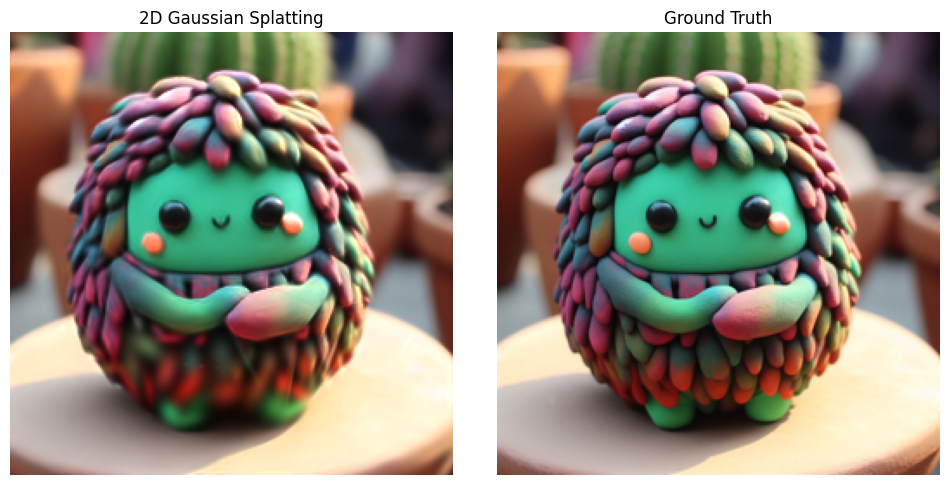

Epoch 2001/2001, Loss: 0.015568627044558525, on 2591 points


In [ ]:
for epoch in range(num_epochs):

    #find indices to remove and update the persistent mask
    if epoch % (densification_interval + 1) == 0 and epoch > 0:
        indices_to_remove = (torch.sigmoid(W[:, 3]) < 0.01).nonzero(as_tuple=True)[0]

        if len(indices_to_remove) > 0:
          print(f"number of pruned points: {len(indices_to_remove)}")

        persistent_mask[indices_to_remove] = False

        # Zero-out parameters and their gradients at every epoch using the persistent mask
        W.data[~persistent_mask] = 0.0


    gc.collect()
    torch.cuda.empty_cache()

    output = W[persistent_mask]

    batch_size = output.shape[0]

    sigma_x = torch.sigmoid(output[:, 0])
    sigma_y = torch.sigmoid(output[:, 1])
    rho = torch.tanh(output[:, 2])
    alpha = torch.sigmoid(output[:, 3])
    colours = torch.sigmoid(output[:, 4:7])
    pixel_coords = torch.tanh(output[:, 7:9])

    colours_with_alpha  = colours * alpha.view(batch_size, 1)
    g_tensor_batch = generate_2D_gaussian_splatting(KERNEL_SIZE, sigma_x, sigma_y,
                            rho, pixel_coords, colours_with_alpha,
                            image_size, device)
    loss = combined_loss(g_tensor_batch, target_tensor, lambda_param=0.2)
    print('Pose Inversion loss %.7f'%(loss))

    optimizer_adam.zero_grad()

    loss.backward()

    # Apply zeroing out of gradients at every epoch
    if persistent_mask is not None:
        W.grad.data[~persistent_mask] = 0.0

    if epoch % densification_interval == 0 and epoch > 0:

      # Calculate the norm of gradients
      gradient_norms = torch.norm(W.grad[persistent_mask][:, 7:9], dim=1, p=2)
      gaussian_norms = torch.norm(torch.sigmoid(W.data[persistent_mask][:, 0:2]), dim=1, p=2)

      sorted_grads, sorted_grads_indices = torch.sort(gradient_norms, descending=True)
      sorted_gauss, sorted_gauss_indices = torch.sort(gaussian_norms, descending=True)

      large_gradient_mask = (sorted_grads > grad_threshold)
      large_gradient_indices = sorted_grads_indices[large_gradient_mask]

      large_gauss_mask = (sorted_gauss > gauss_threshold)
      large_gauss_indices = sorted_gauss_indices[large_gauss_mask]

      common_indices_mask = torch.isin(large_gradient_indices, large_gauss_indices)
      common_indices = large_gradient_indices[common_indices_mask]
      distinct_indices = large_gradient_indices[~common_indices_mask]

      # Split points with large coordinate gradient and large gaussian values and descale their gaussian
      if len(common_indices) > 0:
        print(f"number of splitted points: {len(common_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(common_indices)
        persistent_mask[start_index: end_index] = True
        W.data[start_index:end_index, :] = W.data[common_indices, :]
        scale_reduction_factor = 1.6
        W.data[start_index:end_index, 0:2] /= scale_reduction_factor
        W.data[common_indices, 0:2] /= scale_reduction_factor
        current_marker = current_marker + len(common_indices)

      # Clone it points with large coordinate gradient and small gaussian values
      if len(distinct_indices) > 0:

        print(f"number of cloned points: {len(distinct_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(distinct_indices)
        persistent_mask[start_index: end_index] = True
        W.data[start_index:end_index, :] = W.data[distinct_indices, :]
        current_marker = current_marker + len(distinct_indices)

    optimizer_adam.step()

    loss_history.append(loss.item())

    if epoch % display_interval == 0:
        num_subplots = 3 if display_loss else 2
        fig_size_width = 18 if display_loss else 12

        fig, ax = plt.subplots(1, num_subplots, figsize=(fig_size_width, 6))  # Adjust subplot to 1x3

        generated_array = g_tensor_batch.cpu().detach().numpy()

        ax[0].imshow(g_tensor_batch.cpu().detach().numpy())
        ax[0].set_title('2D Gaussian Splatting')
        ax[0].axis('off')

        ax[1].imshow(target_tensor.cpu().detach().numpy())
        ax[1].set_title('Ground Truth')
        ax[1].axis('off')

        if display_loss:
          ax[2].plot(range(epoch + 1), loss_history[:epoch + 1])
          ax[2].set_title('Loss vs. Epochs')
          ax[2].set_xlabel('Epoch')
          ax[2].set_ylabel('Loss')
          ax[2].set_xlim(0, num_epochs)  # Set x-axis limits

        # Display the image
        #plt.show(block=False)
        plt.subplots_adjust(wspace=0.1)  # Adjust this value to your preference
        plt.pause(0.1)  # Brief pause

        img = Image.fromarray((generated_array * 255).astype(np.uint8))

        # Create filename
        filename = f"{epoch}.jpg"

        # Construct the full file path
        file_path = os.path.join(directory, filename)

        # Save the image
        img.save(file_path)

        fig.savefig(file_path, bbox_inches='tight')

        plt.clf()  # Clear the current figure
        plt.close()  # Close the current figure

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}, on {len(output)} points")




### using pypose

In [ ]:
for epoch in range(num_epochs):

    #find indices to remove and update the persistent mask
    if epoch % (densification_interval + 1) == 0 and epoch > 0:
        indices_to_remove = (torch.sigmoid(mixture.weights[:, 3]) < 0.01).nonzero(as_tuple=True)[0]

        if len(indices_to_remove) > 0:
          print(f"number of pruned points: {len(indices_to_remove)}")

        persistent_mask[indices_to_remove] = False

        # Zero-out parameters and their gradients at every epoch using the persistent mask
        mixture.weights.data[~persistent_mask] = 0.0


    gc.collect()
    torch.cuda.empty_cache()

    mixture.update(persistent_mask)
    loss = optimizer.step(mixture)
    scheduler.step(loss)
    print('Pose Inversion loss %.7f'%(loss))

    loss2 = combined_loss(mixture.g_tensor_batch, target_tensor, 0.2)

    if mixture.weights.grad is not None:
      mixture.weights.grad.data.zero_()

    loss2.backward()


    # Apply zeroing out of gradients at every epoch
    if persistent_mask is not None:
      mixture.weights.grad.data[~persistent_mask] = 0.0

    if epoch % densification_interval == 0 and epoch > 0:

      # Calculate the norm of gradients
      gradient_norms = torch.norm(mixture.weights.grad[persistent_mask][:, 7:9], dim=1, p=2)
      gaussian_norms = torch.norm(torch.sigmoid(mixture.weights.data[persistent_mask][:, 0:2]), dim=1, p=2)

      sorted_grads, sorted_grads_indices = torch.sort(gradient_norms, descending=True)
      sorted_gauss, sorted_gauss_indices = torch.sort(gaussian_norms, descending=True)

      large_gradient_mask = (sorted_grads > grad_threshold)
      large_gradient_indices = sorted_grads_indices[large_gradient_mask]

      large_gauss_mask = (sorted_gauss > gauss_threshold)
      large_gauss_indices = sorted_gauss_indices[large_gauss_mask]

      common_indices_mask = torch.isin(large_gradient_indices, large_gauss_indices)
      common_indices = large_gradient_indices[common_indices_mask]
      distinct_indices = large_gradient_indices[~common_indices_mask]

      # Split points with large coordinate gradient and large gaussian values and descale their gaussian
      if len(common_indices) > 0:
        print(f"number of splitted points: {len(common_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(common_indices)
        persistent_mask[start_index: end_index] = True
        mixture.weights.data[start_index:end_index, :] = mixture.weights.data[common_indices, :]
        scale_reduction_factor = 1.6
        mixture.weights.data[start_index:end_index, 0:2] /= scale_reduction_factor
        mixture.weights.data[common_indices, 0:2] /= scale_reduction_factor
        current_marker = current_marker + len(common_indices)

      # Clone it points with large coordinate gradient and small gaussian values
      if len(distinct_indices) > 0:

        print(f"number of cloned points: {len(distinct_indices)}")
        start_index = current_marker + 1
        end_index = current_marker + 1 + len(distinct_indices)
        persistent_mask[start_index: end_index] = True
        mixture.weights.data[start_index:end_index, :] = mixture.weights.data[distinct_indices, :]
        current_marker = current_marker + len(distinct_indices)

    # optimizer.step()

    loss_history.append(loss.item())

    if epoch % display_interval == 0:
        num_subplots = 3 if display_loss else 2
        fig_size_width = 18 if display_loss else 12

        fig, ax = plt.subplots(1, num_subplots, figsize=(fig_size_width, 6))  # Adjust subplot to 1x3

        generated_array = mixture.g_tensor_batch.cpu().detach().numpy()

        ax[0].imshow(mixture.g_tensor_batch.cpu().detach().numpy())
        ax[0].set_title('2D Gaussian Splatting')
        ax[0].axis('off')

        ax[1].imshow(target_tensor.cpu().detach().numpy())
        ax[1].set_title('Ground Truth')
        ax[1].axis('off')

        if display_loss:
          ax[2].plot(range(epoch + 1), loss_history[:epoch + 1])
          ax[2].set_title('Loss vs. Epochs')
          ax[2].set_xlabel('Epoch')
          ax[2].set_ylabel('Loss')
          ax[2].set_xlim(0, num_epochs)  # Set x-axis limits

        # Display the image
        #plt.show(block=False)
        plt.subplots_adjust(wspace=0.1)  # Adjust this value to your preference
        plt.pause(0.1)  # Brief pause

        img = Image.fromarray((generated_array * 255).astype(np.uint8))

        # Create filename
        filename = f"{epoch}.jpg"

        # Construct the full file path
        file_path = os.path.join(directory, filename)

        # Save the image
        img.save(file_path)

        fig.savefig(file_path, bbox_inches='tight')

        plt.clf()  # Clear the current figure
        plt.close()  # Close the current figure

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item()}, on {len(mixture.output)} points")




# imread

In [ ]:
image_files = []
for i in range(0, num_epochs, display_interval):
  image_files.append(f"{i}.jpg")

# Create a video writer object
writer = imageio.get_writer(os.path.join(directory, 'video.mp4'), fps=2)

# Add images to the video writer
for image_file in image_files:
    image_path = os.path.join(directory, image_file)
    image = imageio.imread(image_path)
    writer.append_data(image)

writer.close()